In [2]:
%matplotlib inline
import pandas as pd
import numpy as np
import folium
from scipy import stats
import matplotlib.pyplot as plt
from matplotlib import colors
import re

In [3]:
data = pd.read_pickle('data/listings_cleaned_V2.pkl')
data = pd.DataFrame(data, columns = ['latitude','longitude','listing_name','listing_url','host_name','host_url','listed_price','accommodates'])
data['price_per_person'] = data.listed_price / data.accommodates
#data.drop(['listed_price','accommodates'], axis='columns', inplace=True)
data.head()

,latitude,longitude,listing_name,listing_url,host_name,host_url,listed_price,accommodates,price_per_person
listing_id,,,,,,,,,
12147973,42.282619,-71.133068,Sunny Bungalow in the City,https://www.airbnb.com/rooms/12147973,Virginia,https://www.airbnb.com/users/show/31303940,250.0,4,62.50
3075044,42.286241,-71.134374,Charming room in pet friendly apt,https://www.airbnb.com/rooms/3075044,Andrea,https://www.airbnb.com/users/show/2572247,65.0,2,32.50
6976,42.292438,-71.135765,Mexican Folk Art Haven in Boston,https://www.airbnb.com/rooms/6976,Phil,https://www.airbnb.com/users/show/16701,65.0,2,32.50
1436513,42.281106,-71.121021,Spacious Sunny Bedroom Suite in Historic Home,https://www.airbnb.com/rooms/1436513,Meghna,https://www.airbnb.com/users/show/6031442,75.0,4,18.75
7651065,42.284512,-71.136258,Come Home to Boston,https://www.airbnb.com/rooms/7651065,Linda,https://www.airbnb.com/users/show/15396970,79.0,2,39.50


In [4]:
#create a color map
my_colors = [(0, 0, 1), (1, 0, 0)] #the first color is blue, the last color is red
cm = colors.LinearSegmentedColormap.from_list("MyMap", my_colors, N=1000) #cm is the color map
color_var = 'price_per_person'
temp_color_var = data[color_var].copy()
temp_color_var = temp_color_var[(np.abs(stats.zscore(temp_color_var)) < 3)] #remove outliers
norm = colors.Normalize(vmin=temp_color_var.quantile(0.10), vmax=temp_color_var.quantile(0.90), clip=True)


In [5]:
#create a map
this_map = folium.Map(prefer_canvas=True, tiles="Stamen Terrain")



def popopHTMLString(point):
    '''input: a series that contains a url somewhere in it and generate html'''
    html = 'Listing: '
    html += '<a href="'
    html += point.listing_url
    html += '"target="_blank">'
    html += re.sub(r"[']+", "\\\\'", point.listing_name)  #to put a \ in front of any ' in the name
    html += ' </a>'

    html += ' <br>'
    html += 'Host: '
    html += '<a href="'
    html += point.host_url
    html += '"target="_blank">'
    html += re.sub(r"[']+", "\\\\'", point.host_name)
    html += ' </a>'
    
    html += ' <br>'
    html += 'Price=${:,.2f}  Accommodates={}'.format(point.listed_price,point.accommodates)
    
    html += ' <br>'
    html += 'Price Per Max Persons=${:,.2f}'.format(point.price_per_person)
    return html

def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    htmlString = folium.Html(popopHTMLString(point), script=True)
    folium.CircleMarker(location=[point.latitude, point.longitude],
                        fill_color=colors.to_hex(cm(norm(point[color_var]))),
                        radius=2,
                        popup = folium.Popup(htmlString),
                        weight=0).add_to(this_map)

#use df.apply(,axis=1) to iterate through every row in your dataframe
data.apply(plotDot, axis = 1)


#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

this_map

In [32]:
this_map.save("pricePerAccomodates.html")


In [6]:
this_map.head()

AttributeError: 'Map' object has no attribute 'head'

In [2]:
data = pd.read_pickle('data/listings_cleaned_V2.pkl')
data = pd.DataFrame(data, columns = ['latitude','longitude','listing_name','listing_url','host_name','host_url','calculated_host_listings_count'])
data.head()

,latitude,longitude,listing_name,listing_url,host_name,host_url,calculated_host_listings_count
listing_id,,,,,,,
12147973,42.282619,-71.133068,Sunny Bungalow in the City,https://www.airbnb.com/rooms/12147973,Virginia,https://www.airbnb.com/users/show/31303940,1
3075044,42.286241,-71.134374,Charming room in pet friendly apt,https://www.airbnb.com/rooms/3075044,Andrea,https://www.airbnb.com/users/show/2572247,1
6976,42.292438,-71.135765,Mexican Folk Art Haven in Boston,https://www.airbnb.com/rooms/6976,Phil,https://www.airbnb.com/users/show/16701,1
1436513,42.281106,-71.121021,Spacious Sunny Bedroom Suite in Historic Home,https://www.airbnb.com/rooms/1436513,Meghna,https://www.airbnb.com/users/show/6031442,1
7651065,42.284512,-71.136258,Come Home to Boston,https://www.airbnb.com/rooms/7651065,Linda,https://www.airbnb.com/users/show/15396970,1


In [7]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import colors
from scipy import stats
from folium.plugins import FloatImage

#p = [(1,0),(3,.25),(6,.5),(11,.75),(136,1)]
p = [(1,0),(4.5,.25),(8,.5),(30.5,.75),(136,1)]
def peiceLinNorm(val):
    for n in range(len(p)-1):
        if val<=p[n+1][0]:
            x1=p[n][0]
            y1=p[n][1]
            x2=p[n+1][0]
            y2=p[n+1][1]
            return ((y2-y1)/(x2-x1))*(val-x1)+y1

def peiceLinNormInv(val):
    for n in range(len(p)-1):
        if val<=p[n+1][1]:
            x1=p[n][0]
            y1=p[n][1]
            x2=p[n+1][0]
            y2=p[n+1][1]
            return (val-y1)/((y2-y1)/(x2-x1))+x1

#create a map
this_map = folium.Map(prefer_canvas=True, tiles="Stamen Toner")

#create a color map
buckets = [(1,2+1),(3,5+1),(6,10+1),(11,49+1),(50,136+1)]
color_names = ['blue','lightskyblue','limegreen','orange','red']
color_dict = {}
for n in range(len(buckets)):
    for m in range(buckets[n][0],buckets[n][1]):
        color_dict[m] = colors.to_hex(color_names[n])


my_colors = [colors.to_rgb(c) for c in color_names ]
cm = colors.LinearSegmentedColormap.from_list("MyMap", my_colors, N=1000) #cm is the color map
color_var = 'calculated_host_listings_count' #what variable will determine the color
norm = colors.Normalize(vmin=data[color_var].min(), vmax=data[color_var].max())

#####################
##  Create Legend  ##
#####################

fig = plt.figure(figsize=(4, .1))
ax = fig.add_axes([1, 1, 1, 1])

leg = mpl.colorbar.ColorbarBase(ax, cmap=cm,
                                norm=norm,
                                orientation='horizontal')
leg.set_ticks([norm.inverse(0),norm.inverse(.25),norm.inverse(.5),norm.inverse(.75),norm.inverse(1)])
leg.set_ticklabels([peiceLinNormInv(0),peiceLinNormInv(.25),peiceLinNormInv(.5),peiceLinNormInv(.75),peiceLinNormInv(1)])

fig.text(1.5, 2, color_var,
        horizontalalignment='center',
        verticalalignment='bottom')

fig.savefig('legend'+color_var+'.png', bbox_inches='tight',transparent=True)
plt.close(fig)
#To DO:  there has to be a smarter way to do this
FloatImage('http://localhost:8901/files/legend'+color_var+'.png',bottom=90, left=65).add_to(this_map)


#####################
##    The End      ##
#####################

def popopHTMLString(point):
    '''input: a series that contains a url somewhere in it and generate html'''
    html = 'Listing: '
    html += '<a href="'
    html += point.listing_url
    html += '"target="_blank">'
    html += re.sub(r"[']+", "\\\\'", point.listing_name)  #to put a \ in front of any ' in the name
    html += ' </a>'

    html += ' <br>'
    html += 'Host: '
    html += '<a href="'
    html += point.host_url
    html += '"target="_blank">'
    html += re.sub(r"[']+", "\\\\'", point.host_name)
    html += ' </a>'
    
    html += ' <br>'
    html += 'calculated host listings count= '
    html += str(point.calculated_host_listings_count)
    
    return html


def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    htmlString = folium.Html(popopHTMLString(point), script=True)
    folium.CircleMarker(location=[point.latitude, point.longitude],
                        fill_color=colors.to_hex(cm(peiceLinNorm(point[color_var]))),
                        radius=2,
                        popup = folium.Popup(htmlString),
                        weight=0).add_to(this_map)

#use df.apply(,axis=1) to iterate through every row in your dataframe
data.apply(plotDot, axis = 1)


#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

this_map

In [8]:
this_map.save("coloredBy"+color_var+".html")

In [12]:
color_names = ['blue','lightskyblue','limegreen','orange','red']
for c in color_names:
[colors.to_rgb(c) for c in color_names ]

(0.0, 0.0, 1.0)
(0.5294117647058824, 0.807843137254902, 0.9803921568627451)
(0.19607843137254902, 0.803921568627451, 0.19607843137254902)
(1.0, 0.6470588235294118, 0.0)
(1.0, 0.0, 0.0)


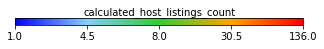

In [68]:
my_colors = [colors.to_rgb(c) for c in color_names ]
cm = colors.LinearSegmentedColormap.from_list("MyMap", my_colors, N=1000) #cm is the color map
color_var = 'calculated_host_listings_count' #what variable will determine the color
norm = colors.Normalize(vmin=data[color_var].min(), vmax=data[color_var].max())

fig = plt.figure(figsize=(4, .1))
ax = fig.add_axes([1, 1, 1, 1])

leg = mpl.colorbar.ColorbarBase(ax, cmap=cm,
                                norm=norm,
                                orientation='horizontal')
leg.set_ticks([norm.inverse(0),norm.inverse(.25),norm.inverse(.5),norm.inverse(.75),norm.inverse(1)])
leg.set_ticklabels([peiceLinNormInv(0),peiceLinNormInv(.25),peiceLinNormInv(.5),peiceLinNormInv(.75),peiceLinNormInv(1)])

fig.text(1.5, 2, color_var,
        horizontalalignment='center',
        verticalalignment='bottom')

In [22]:
buckets = [(1,2+1),(3,5+1),(6,10+1),(11,49+1),(50,136+1)]
color_names = ['blue','lightskyblue','limegreen','orange','red']
v = data.calculated_host_listings_count.copy()

In [51]:
norm.inverse(1)

136.0

In [31]:
1 -> 0 blue
4.5 ->.25 lightskyblue
8->.5 limegreem
30.5 ->.75 oragange
136 ->1 red

SyntaxError: invalid syntax (<ipython-input-31-1ad0f3f4ee0c>, line 1)

In [67]:
#p = [(1,0),(3,.25),(6,.5),(11,.75),(136,1)]
p = [(1,0),(4.5,.25),(8,.5),(30.5,.75),(136,1)]
def peiceLinNorm(val):
    for n in range(len(p)):
        if val<=p[n+1][0]:
            x1=p[n][0]
            y1=p[n][1]
            x2=p[n+1][0]
            y2=p[n+1][1]
            return ((y2-y1)/(x2-x1))*(val-x1)+y1

def peiceLinNormInv(val):
    for n in range(len(p)):
        if val<=p[n+1][1]:
            x1=p[n][0]
            y1=p[n][1]
            x2=p[n+1][0]
            y2=p[n+1][1]
            return (val-y1)/((y2-y1)/(x2-x1))+x1

In [9]:
fig = plt.figure(figsize=(4, .1))
ax = fig.add_axes([1, 1, 1, 1])

leg = mpl.colorbar.ColorbarBase(ax, cmap=cm,
                                norm=norm,
                                orientation='horizontal')
leg.set_ticks([norm.inverse(0),norm.inverse(.25),norm.inverse(.5),norm.inverse(.75),norm.inverse(1)])
leg.set_ticklabels([peiceLinNormInv(0),peiceLinNormInv(.25),peiceLinNormInv(.5),peiceLinNormInv(.75),peiceLinNormInv(1)])

fig.text(1.5, 2, color_var,
        horizontalalignment='center',
        verticalalignment='bottom')

fig.savefig('legend'+color_var+'.png', bbox_inches='tight',transparent=False)
plt.close(fig)

In [7]:
from bokeh.io import show
from bokeh.models import LogColorMapper
from bokeh.palettes import Viridis6 as palette
from bokeh.plotting import figure

from bokeh.sampledata.us_counties import data as counties
from bokeh.sampledata.unemployment import data as unemployment

palette.reverse()

counties = {
    code: county for code, county in counties.items() if county["state"] == "tx"
}

county_xs = [county["lons"] for county in counties.values()]
county_ys = [county["lats"] for county in counties.values()]

county_names = [county['name'] for county in counties.values()]
county_rates = [unemployment[county_id] for county_id in counties]
color_mapper = LogColorMapper(palette=palette)

data=dict(
    x=county_xs,
    y=county_ys,
    name=county_names,
    rate=county_rates,
)

TOOLS = "pan,wheel_zoom,reset,hover,save"

p = figure(
    title="Texas Unemployment, 2009", tools=TOOLS,
    x_axis_location=None, y_axis_location=None,
    tooltips=[
        ("Name", "@name"), ("Unemployment rate)", "@rate%"), ("(Long, Lat)", "($x, $y)")
    ])
p.grid.grid_line_color = None
p.hover.point_policy = "follow_mouse"

p.patches('x', 'y', source=data,
          fill_color={'field': 'rate', 'transform': color_mapper},
          fill_alpha=0.7, line_color="white", line_width=0.5)

show(p)

AttributeError: unexpected attribute 'tooltips' to Figure, possible attributes are above, aspect_scale, background_fill_alpha, background_fill_color, below, border_fill_alpha, border_fill_color, css_classes, disabled, extra_x_ranges, extra_y_ranges, h_symmetry, height, hidpi, inner_height, inner_width, js_event_callbacks, js_property_callbacks, layout_height, layout_width, left, lod_factor, lod_interval, lod_threshold, lod_timeout, match_aspect, min_border, min_border_bottom, min_border_left, min_border_right, min_border_top, name, outline_line_alpha, outline_line_cap, outline_line_color, outline_line_dash, outline_line_dash_offset, outline_line_join, outline_line_width, output_backend, plot_height, plot_width, renderers, right, sizing_mode, subscribed_events, tags, title, title_location, toolbar, toolbar_location, toolbar_sticky, v_symmetry, width, x_range, x_scale, y_range or y_scale